<a href="https://colab.research.google.com/github/Auryvilia/Komputer_Grafik/blob/main/Image_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


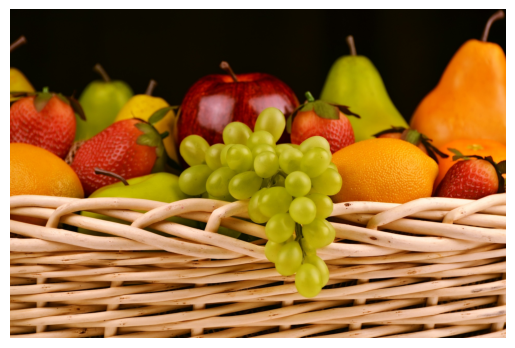

Hasil Global Thresholding


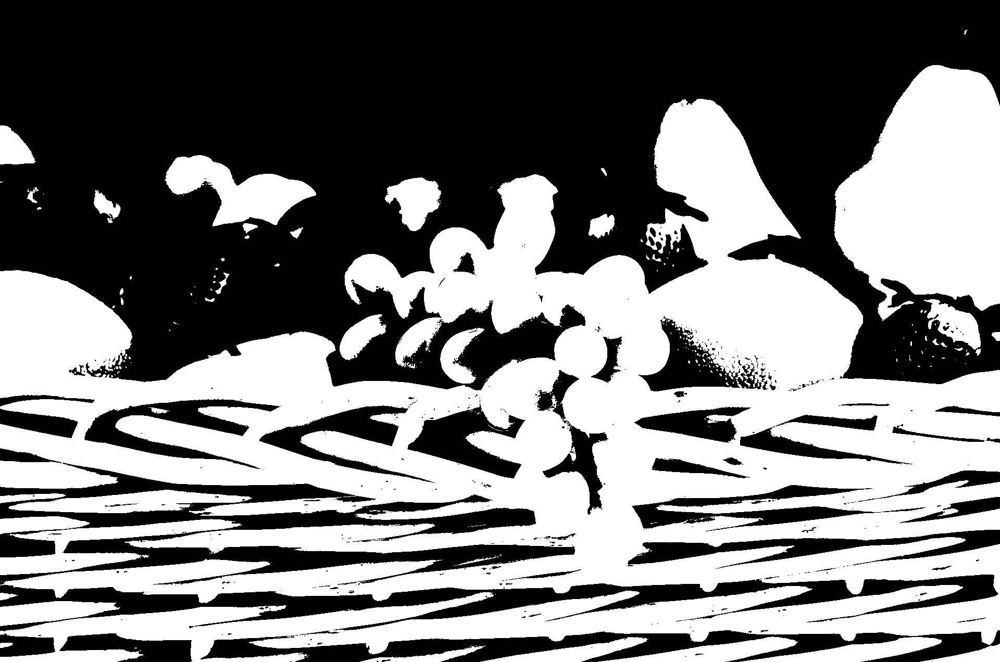

Hasil Otsu Thresholding


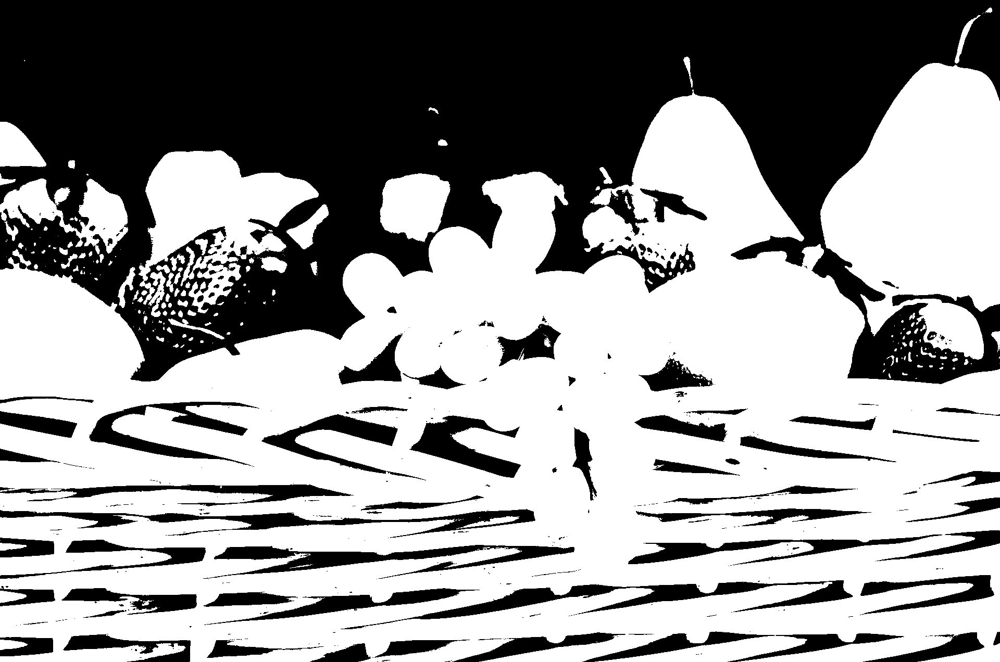

Hasil Erotion


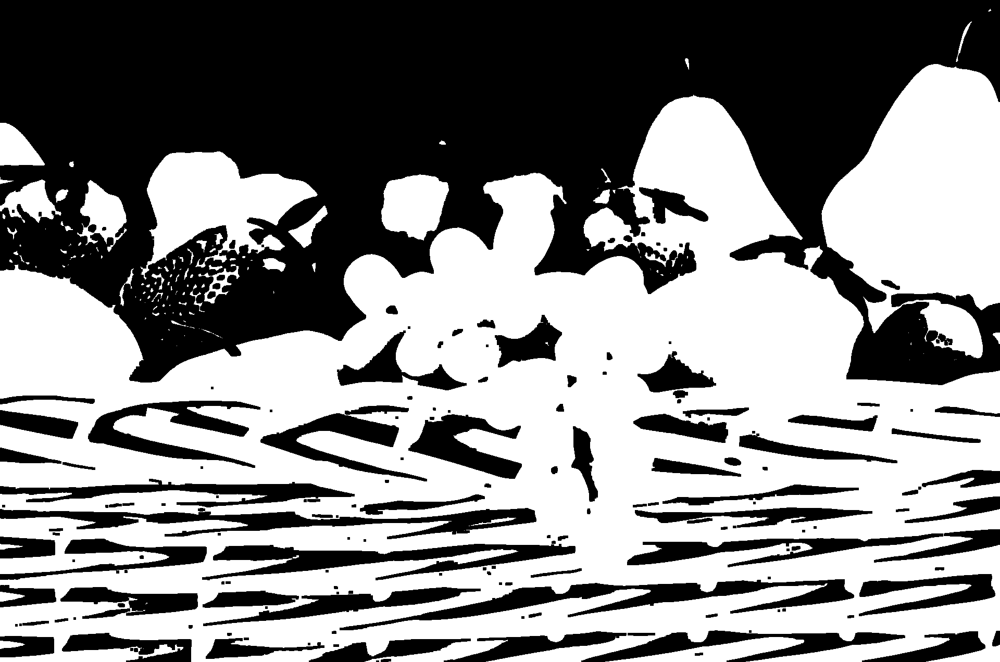

Hasil Dilation


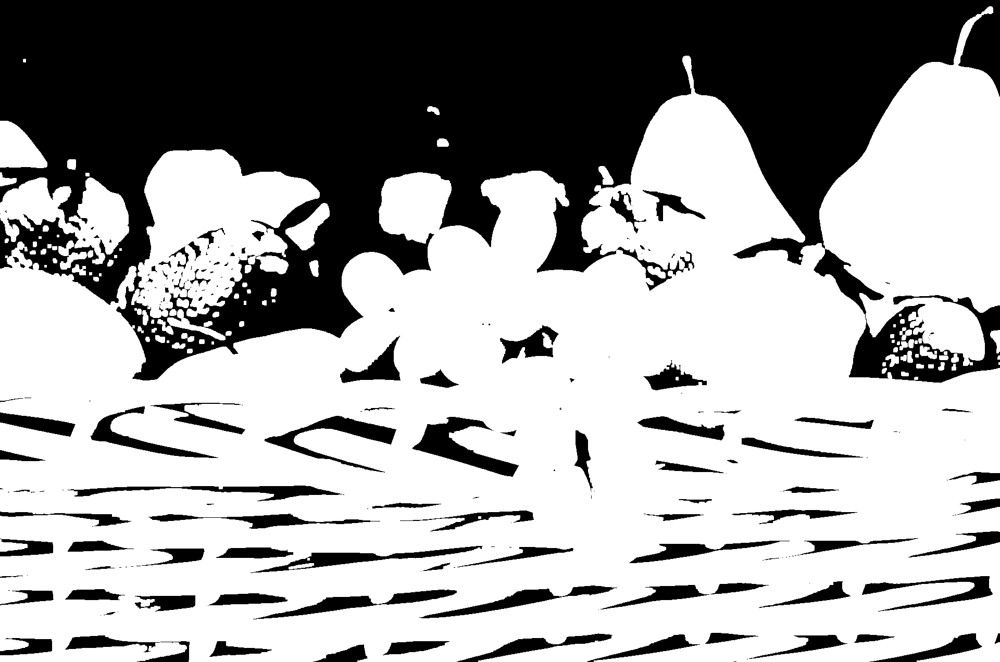

Hasil Sobel Edge Detection


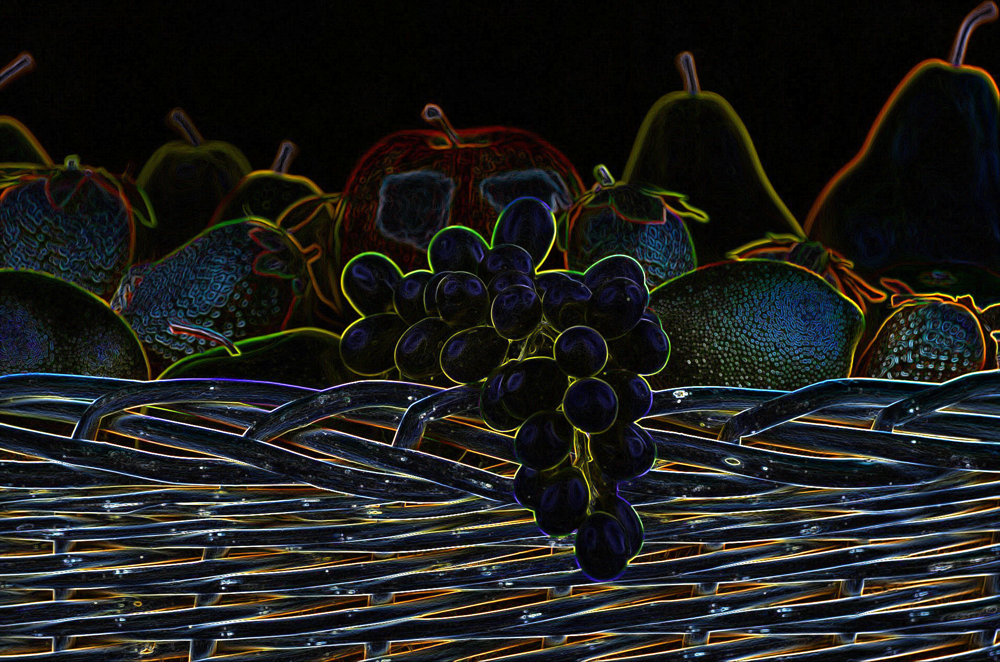

Hasil Canny Edge Detection


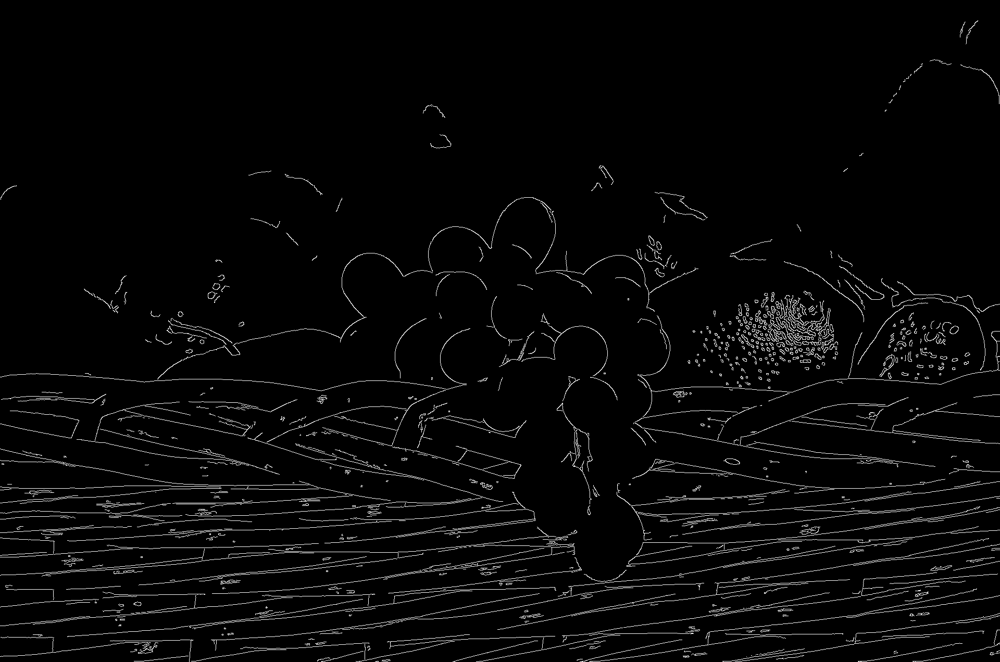

Hasil Region-based Segmentation


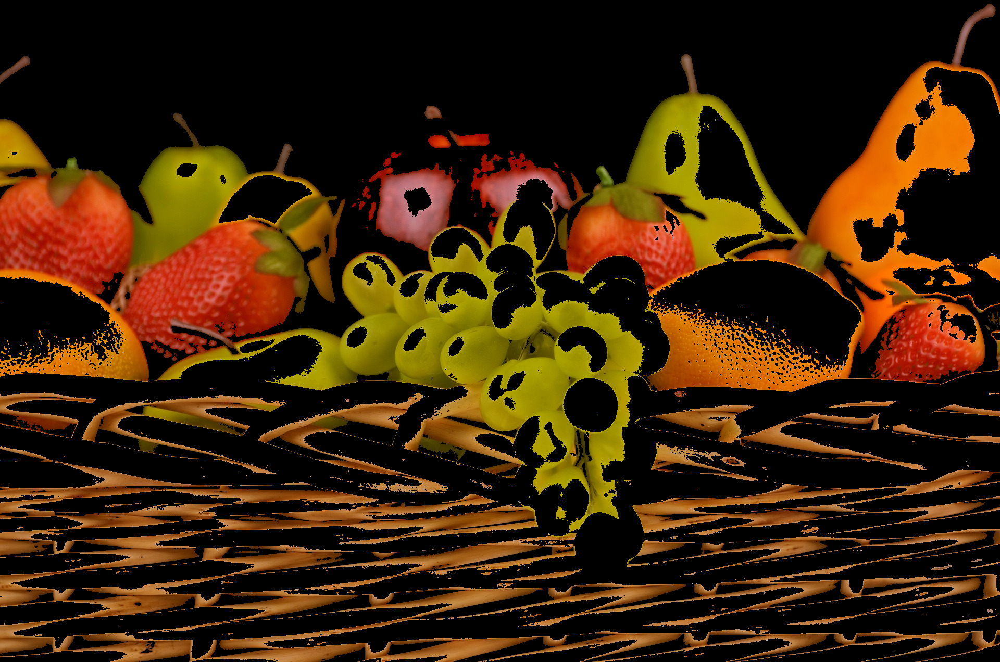

Hasil Color-based Segmentation


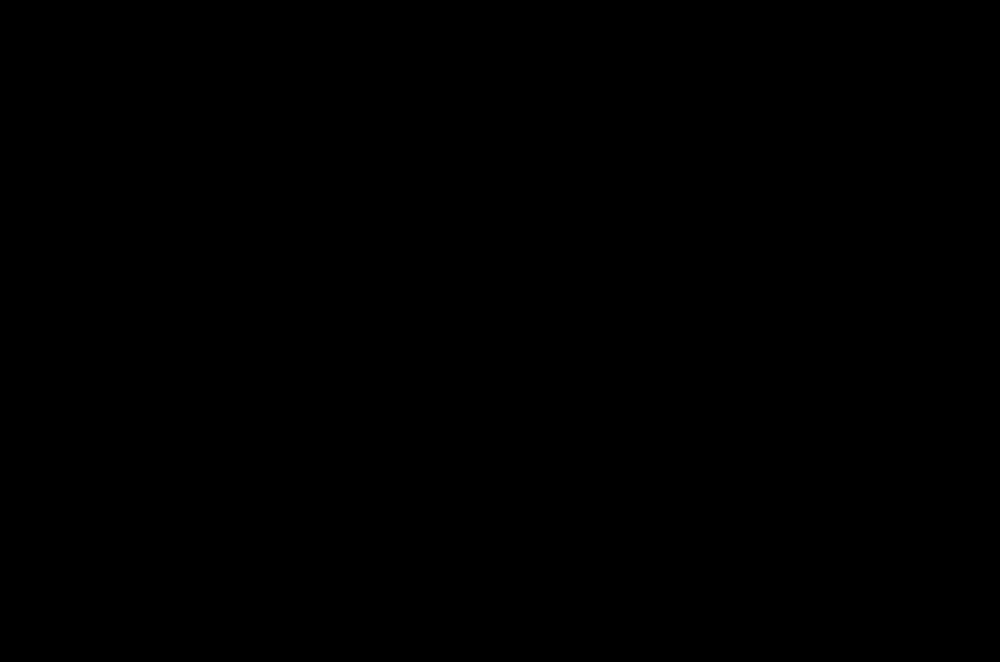

Hasil Gray


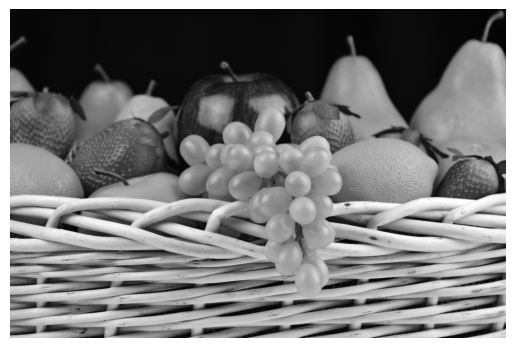

Hasil HSV


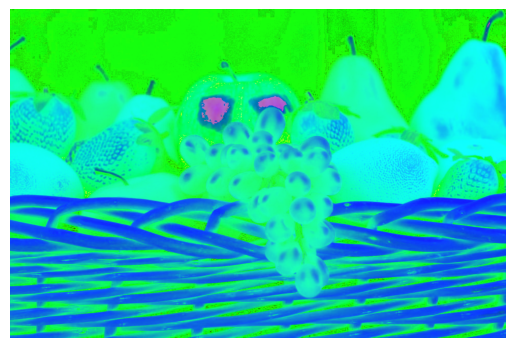

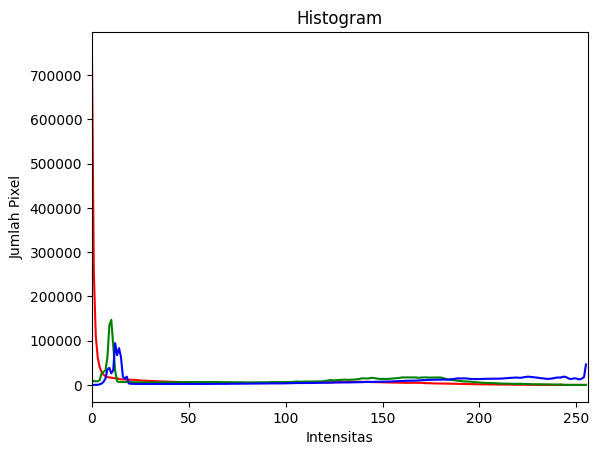

In [ ]:
from google.colab import drive
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import numpy as np
import cv2


drive.mount('/content/drive')


image_path = '/content/drive/MyDrive/Kuliah/Semester 5/Komputer Grafik/fruit.jpg'
image = cv2.imread(image_path)

#BGR to RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.imshow(image_rgb)
plt.axis('off')
plt.show()

#Global Thresholding grayscale
img_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
_, threshold_image = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)
print('Hasil Global Thresholding')
image_thresholding = cv2_imshow(threshold_image)

#Otsu Tresholding
_, thres_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
print('Hasil Otsu Thresholding')
image_otsu = cv2_imshow(thres_otsu)

#Morphologi Operation : Erotion
kernel = np.ones((5, 5), np.uint8)
eroded_image = cv2.erode(thres_otsu, kernel, iterations=1)
print('Hasil Erotion')
image_eroded = cv2_imshow(eroded_image)

#Dilation
dilated_image = cv2.dilate(thres_otsu, kernel, iterations=1)
print('Hasil Dilation')
image_dilated = cv2_imshow(dilated_image)

#Sobel Edge Detevtion
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
sobel_edge = cv2.magnitude(sobel_x, sobel_y)
print('Hasil Sobel Edge Detection')
image_sobel = cv2_imshow(sobel_edge)

#canny Edge Detection
edges_canny = cv2.Canny(image, 100, 200)
print('Hasil Canny Edge Detection')
image_canny = cv2_imshow(edges_canny)

#region-based segmentation
lower = np.array([50])
upper = np.array([150])

mask = cv2.inRange(img_gray, lower, upper)
segmented_region = cv2.bitwise_and(image, image, mask=mask)
print('Hasil Region-based Segmentation')
image_segmentation = cv2_imshow(segmented_region)


#color-based segmentation
img_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
lower_hue= np.array([235, 52, 52])
upper_hue = np.array([235, 116, 52])

mask_color = cv2.inRange(img_hsv, lower_hue, upper_hue)
segmented_color = cv2.bitwise_and(image, image, mask=mask_color)
print('Hasil Color-based Segmentation')
cv2_imshow(segmented_color)

#Gray
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap='gray')
plt.axis('off')
print('Hasil Gray')
plt.show()

#HSV
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
plt.imshow(hsv_image)
plt.axis('off')
print('Hasil HSV')
plt.show()


#histogram
colors = ('r', 'g', 'b')
for i, color in enumerate(colors):
    histogram = cv2.calcHist([image], [i], None, [256], [0, 256])
    plt.plot(histogram, color=color)
    plt.xlim([0, 256])

plt.title('Histogram')
plt.xlabel('Intensitas')
plt.ylabel('Jumlah Pixel')
plt.show()